# Hoja #2
- Ligia Priscila Coque Micán
- Sergio Amórtegui Ardila
- Juan Sotelo Aguilar

In [1]:
import scipy.special

def get_assignments(d):

    m = scipy.special.comb(d + 2, 2)
    q = 2

    def get_assignments_req(q, partial_assignment, assignments):
        if len(partial_assignment) == d:
            partial_assignment.append(q - sum(partial_assignment))
            assignments.append(partial_assignment)
        else:
            possible_ns = q - sum(partial_assignment)
            for n_i in range(possible_ns + 1):
                new_partial_assignment = partial_assignment.copy()
                new_partial_assignment.append(n_i)
                get_assignments_req(q, new_partial_assignment, assignments)

    assignments = []
    get_assignments_req(q, [], assignments)
    return assignments

## Exercise 1 (6 points)

### Function: `svm_kernel_analysis(X, y)`

Write a function `svm_kernel_analysis(X, y)` that will do the following (assuming that $y$ is binary):

1. Split the data into 80% training and 20% test.
2. Reduce the data to two dimensions using standardization and then a PCA.
3. For each of the four standard scikit-learn kernels, create a set of figures to visualize the SVM behavior for $C \in \{10^{-2}, ..., 10^6\}$.
   
   To this end, train the SVM using $X$ and then visualize the SVM behavior using `contourf`, and also plot the training points.
   
   - **For the linear kernel**, you simply get one row with 9 plots (one for each $C$).
   - **For the other kernels**:
     - For the RBF and sigmoid kernel, create one row for each $\gamma \in \{0.01, 0.1, 1, 10, 100\}$ (45 plots in total per kernel within a $5 \times 9$ grid).
     - For the polynomial kernel, create one row for the degrees 2 and 3.
   
   **Hints:**
   - Use `sklearn` pipelines to cleanly fit the model (including scaling and PCA) only on the training data.
   - Make sure that figure titles are readable (even though they may be small, they should not overlap).

4. **Record the runtimes** (for training). For each kernel, create a figure using $C$ on the x-axis. If there is another variable, like $\gamma$ OR "degree", then create a 3D wireframe or surface plot! In any case, the runtime should be shown on the vertical axis, and make sure to use a logarithmic scale on that axis!
   
   Then create another 3D figure in which you use $C$, the (log$_{10}$) runtime, and the accuracy on the test data as the three dimensions. Here, use one color for each kernel.

### Application:

Apply the function to the **Iris dataset** (versicolor (middle class) vs. rest) and the **Breast Cancer dataset**.

Compare the models found using the different kernels and the different hyperparameter configurations. How are **runtime, decision boundary, and test performance** affected by $C$?



Analizando Iris (versicolor vs. resto)...


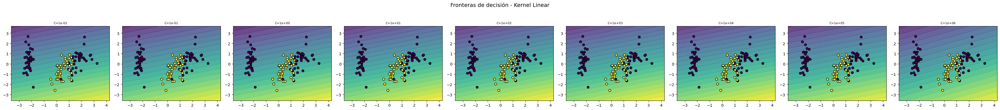

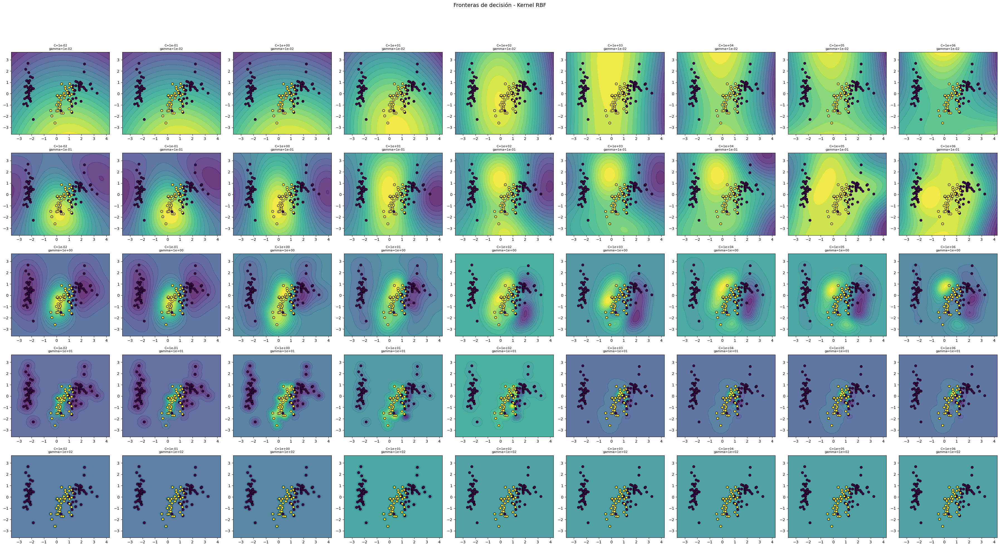

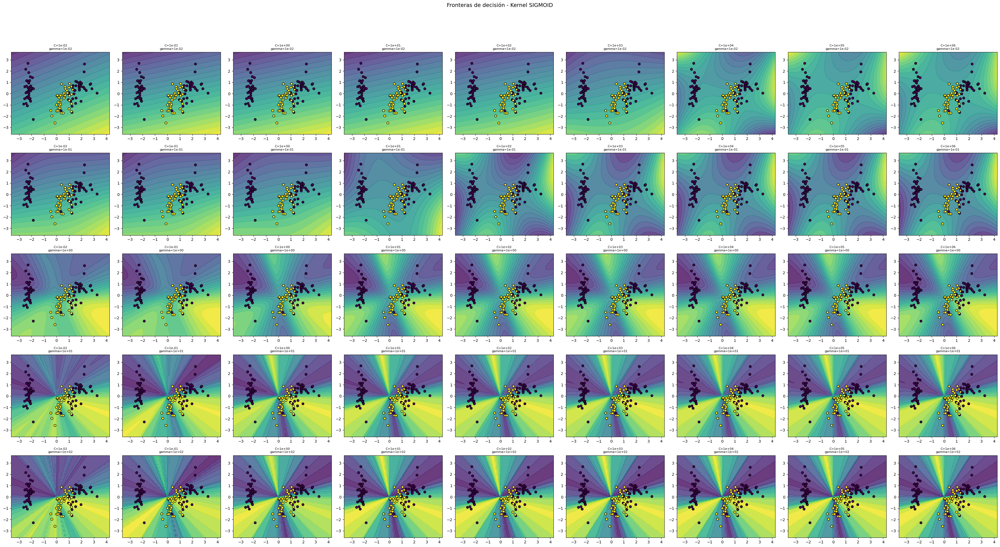

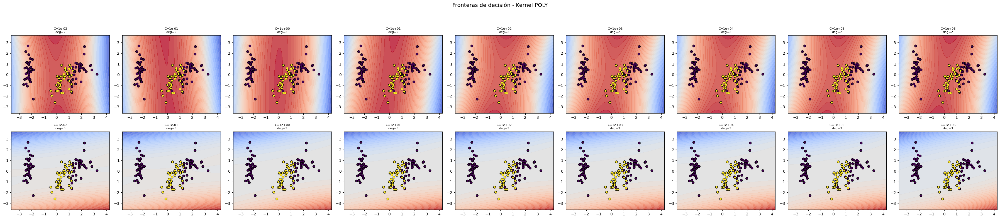

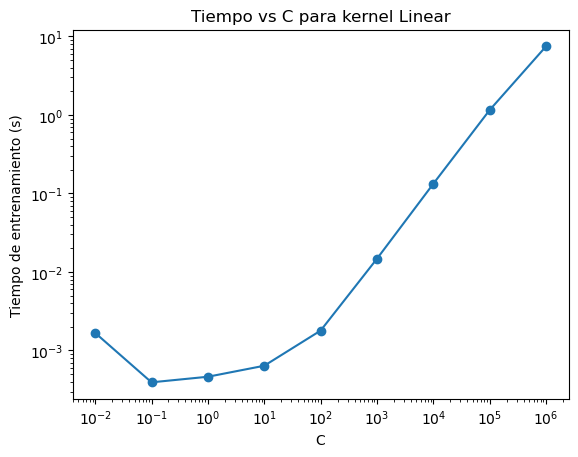

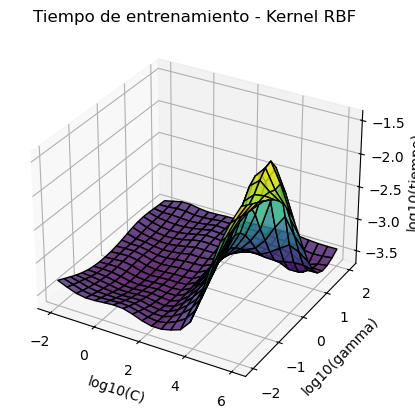

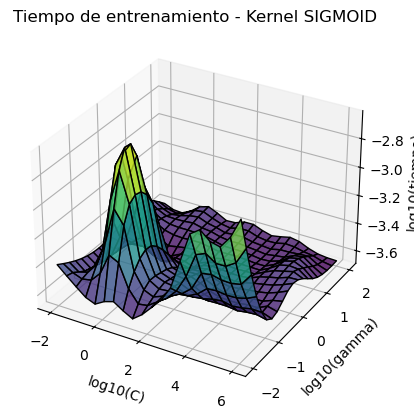

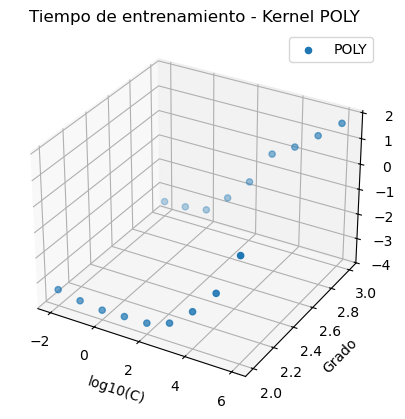

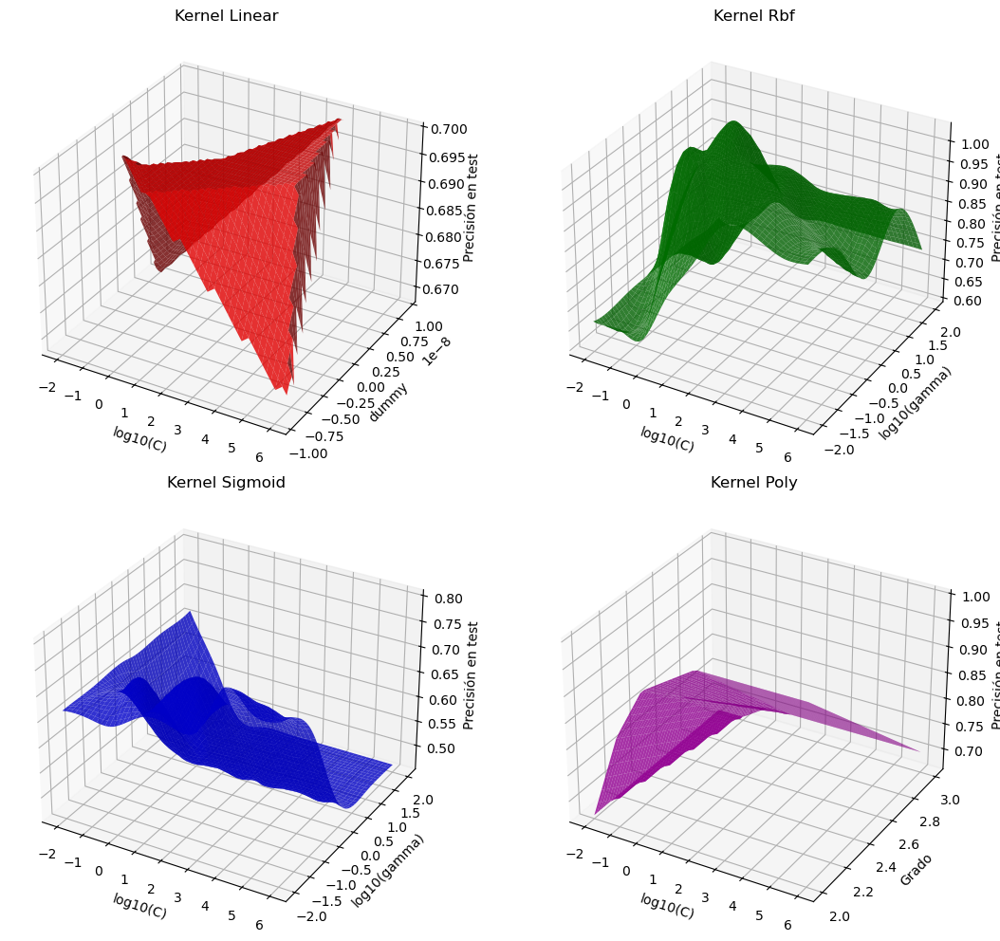

Analizando Breast Cancer...


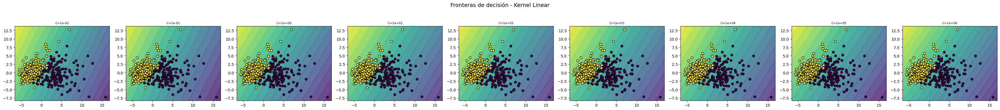

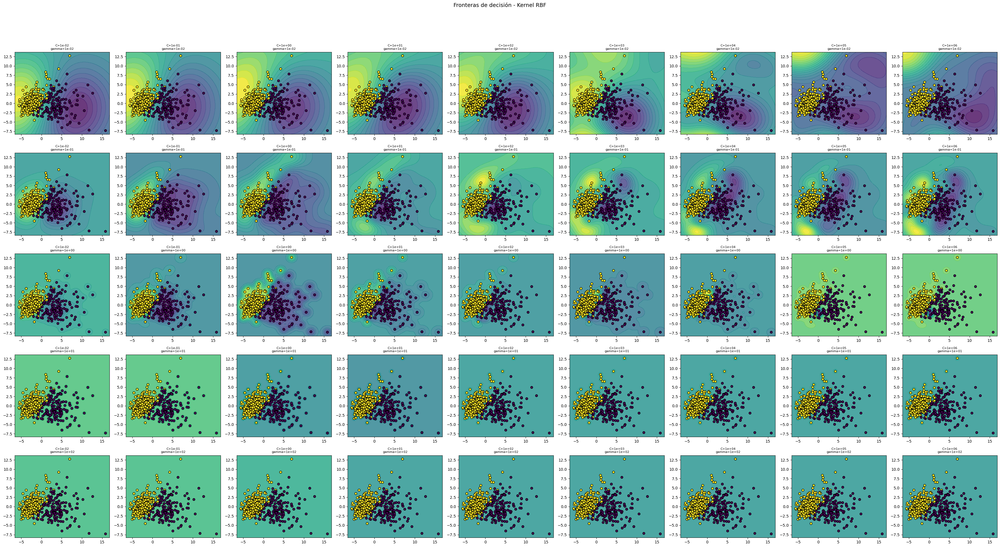

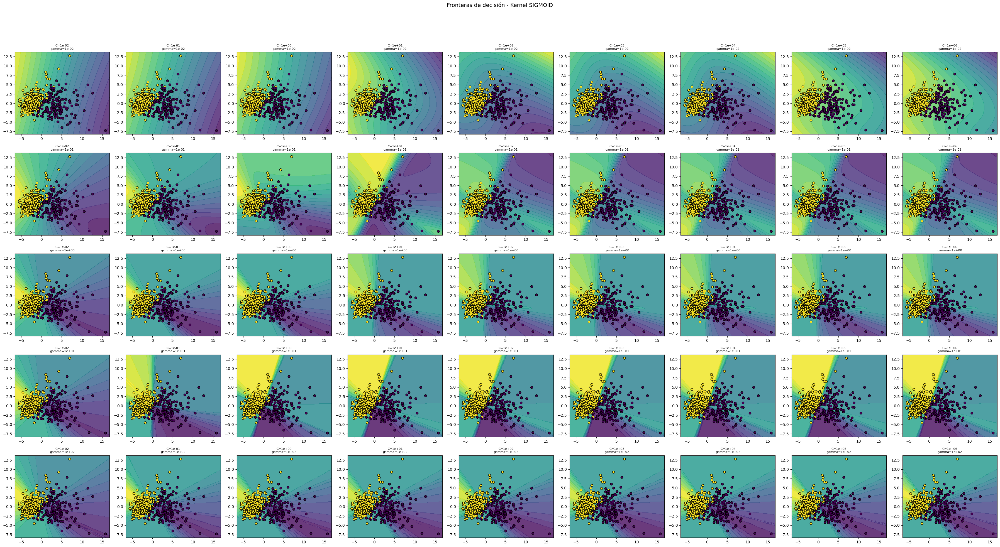

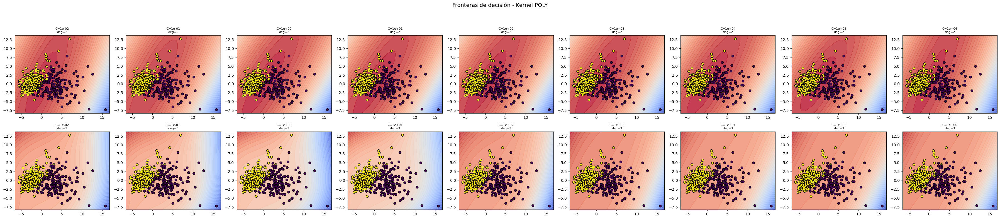

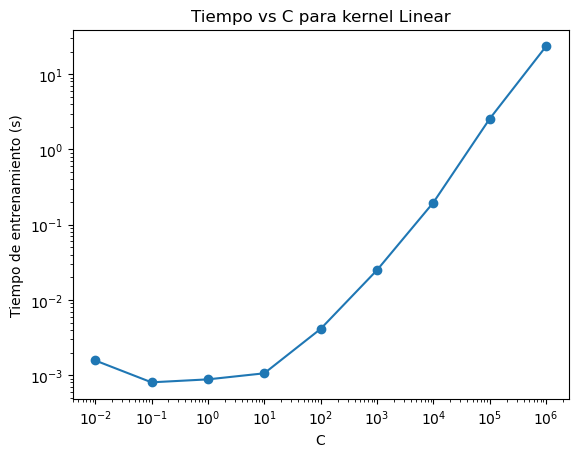

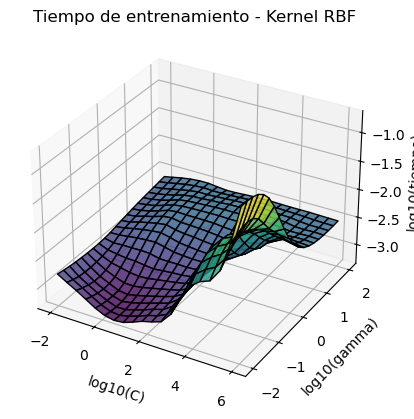

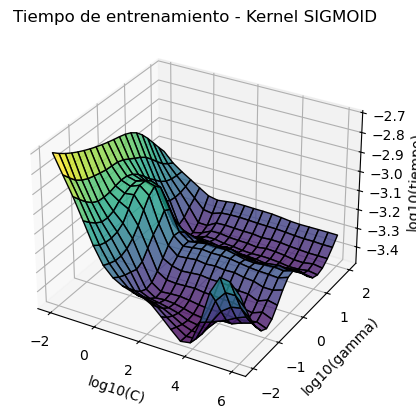

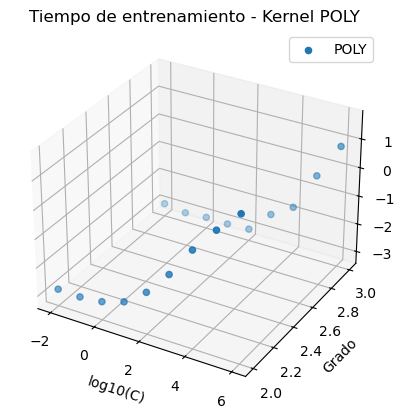

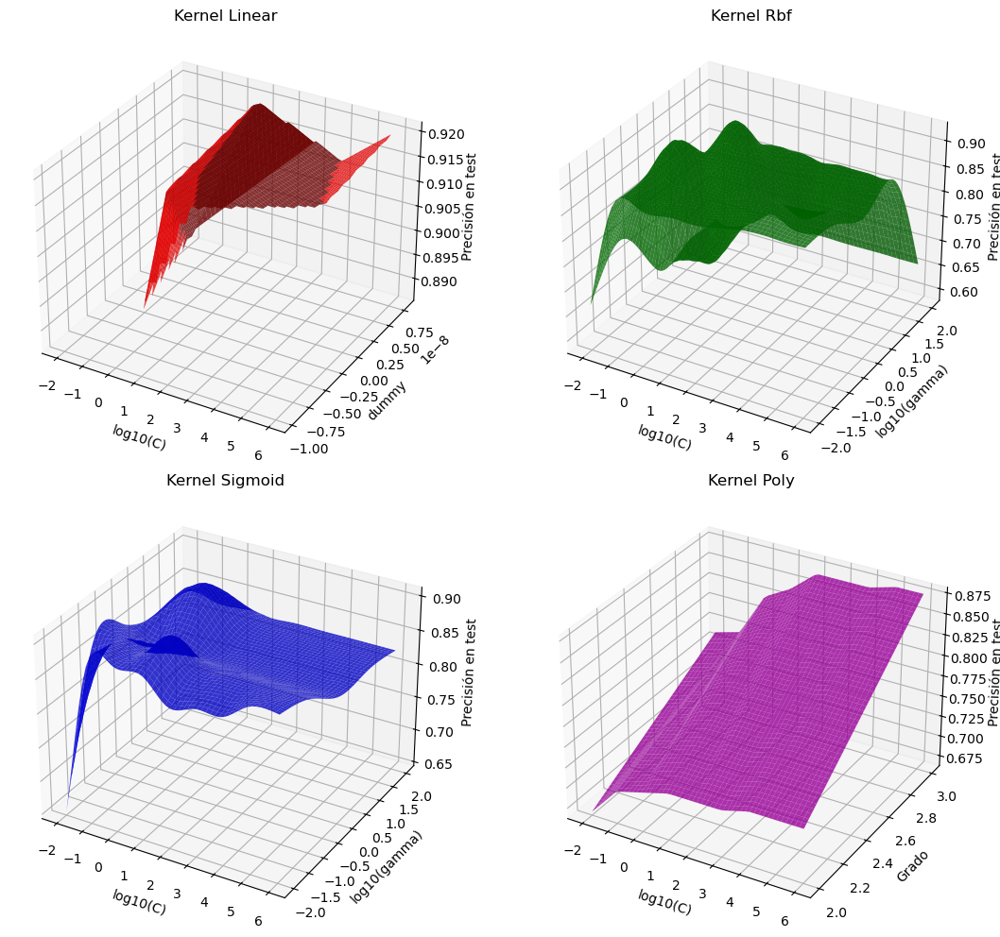

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import time
from mpl_toolkits.mplot3d import Axes3D  # para gráficos 3D
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import scipy.interpolate as interp

def svm_kernel_analysis(X, y):
    """
    Realiza el análisis de kernels para SVM:
      1. Divide los datos en entrenamiento (80%) y test (20%), para esto se usa train_test_split.
      2. Escala los datos y reduce la dimensionalidad a 2 dimensiones usando una estandarización y después PCA, usando pipelines.
      3. Para cada kernel y configuración de hiperparámetros:
           - Entrena el modelo.
           - Visualiza la frontera de decisión usando contourf junto con los puntos de entrenamiento.
      4. Registra el tiempo de entrenamiento y genera gráficos (incluyendo 3D) mostrando
         el tiempo (en escala logarítmica) y la precisión en test.
    """
    # 1. Dividir los datos
      # Usamos la función train_test_split
      # Reservamos 20% para el testeo
      # Usamos stratify para definir que
      # la proporción de las clases se mantiene igual en testeo y entrenamiento
      # Definimos X_train, X_test, y_train, y_test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=2025)

    # 2. Pipeline: Escalado y PCA a 2 dimensiones
      # Definimos un pipeline con dos pasos usando la función make_pipeline:
        # i. Estandarizar con media 0 y varianza 1
        # ii. Reducir dimensionalidad a 2 dimensiones
        # Redefinimos X train y X Test
    pipe = make_pipeline(StandardScaler(), PCA(n_components=2))
      # Usamos .fit_transform para realizar la transformación usando hiperparámetros
      # de la misma muestra
    X_train_trans = pipe.fit_transform(X_train)
      # Usamos .transform en lugar de .fit_transform porque así no se sesga
      # las observaciones de testeo con los hiperparámetros de entrenamiento
    X_test_trans = pipe.transform(X_test)

    # Crear un arreglo en 2D para visualizar la frontera de decisión
      # Creamos unas variables que nos guardan los puntos máximos y mínimos
      # de ambas variables para definir un espacio donde el gráfico de
      # dispersión quepa de forma estética, con una márgen de 1.
        # Eje X
    x_min, x_max = X_train_trans[:, 0].min() - 1, X_train_trans[:, 0].max() + 1
        # Eje Y
    y_min, y_max = X_train_trans[:, 1].min() - 1, X_train_trans[:, 1].max() + 1
        # Creamos dos listas de 100 carácteres cada uno entre los extremos
        # del espacio seleccionado usando linspace
        # Usando meshgrid repetimos cada lista 100 veces para crear una grilla
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        # Juntamos las grillas en un arreglo de muchas filas y dos columnas,
        # representando las coordenadas de cada punto, usando np.c_[].
    grid_points = np.c_[xx.ravel(), yy.ravel()]

    # Valores de C a evaluar los modelos (de 10^-2 a 10^6, 9 valores)
    C_values = np.logspace(-2, 6, 9)

    # Diccionario para almacenar tiempos de entrenamiento y precisión para cada kernel
    runtime_info = {}

    # 1. Definimos el kernel lineal para comenzar a graficar
    kernel = 'linear'
    # Guardamos la información del consumo de recursos
    # Lo llamamos runtime_info[kernel] en lugar de solo runtime_info
    # porque así organizamos los resultados por kernel
    runtime_info[kernel] = []
    # Creamos una grilla de gráficas con una fila, C columnas
    # 4 pulgadas de alto y 4 de alto sin importar el número de C
    fig, axes = plt.subplots(1, len(C_values), figsize=(4*len(C_values), 4))
    # Definimos el subtítulo
    fig.suptitle("Fronteras de decisión - Kernel Linear", fontsize=14)

    # Hacemos un ciclo for para entrenar un SVM (un SVC realmente) para cada C
    for i, C in enumerate(C_values):
        # Creamos el modelo vacío con el C especificado
        clf = SVC(kernel=kernel, C=C)
        # Medimos el momento de inicio del entrenamiento
        start = time.time()
        # Entrenamos el modelo
        clf.fit(X_train_trans, y_train)
        # Calculamos cuando demoró el entrenamiento
        elapsed = time.time() - start
        # Sacamos métricas de score, en este caso, accuracy
        acc = clf.score(X_test_trans, y_test)
        # Guardamos en runtime_info cuanto se demora el entrenamiento
        runtime_info[kernel].append((C, None, elapsed, acc))

        # Predecir la función de decisión en la grilla
          # Corremos el modelo, usando su función en cada punto de grid_points
          # Es decir, tomamos grid_points, que tiene 10.000 filas y dos columnas
          # y me devuelve una sola columna de 10.000 filas que puedo transformar
          # en una matriz de 100x100 usando .reshape.
        Z = clf.decision_function(grid_points).reshape(xx.shape)
        # Seleccionamos la posición i
        ax = axes[i]
        # Usamos la función contour para hacer un mapa de colores de las áreas
        # con resultados similares en Z. Dividimos el área en 20 contornos,
        # Usamos el colormap viridis
        ax.contourf(xx, yy, Z, levels=20, cmap='viridis', alpha=0.8)
        # Ponemos los puntos de entrenamiento en el scatter plot
        ax.scatter(X_train_trans[:, 0], X_train_trans[:, 1], c=y_train, edgecolors='k')
        # Definimos el título en notación científica
        ax.set_title("C=%.0e" % C, fontsize=8)
    # Apretamos las gráficas para que los subplots ocupen todo el ancho de la
    # figura (desde 0 a 1) y hasta el 93% de la altura total.
    plt.tight_layout(rect=[0, 0, 1, 0.93])

    # 2. Creamos un ciclo for para los kernels con estas categorías
    for kernel in ['rbf', 'sigmoid']:
        # Definimos la lista con la información de los modelos
        runtime_info[kernel] = []
        # Definimos los posibles valores de gamma
        gamma_values = [0.01, 0.1, 1, 10, 100]  # 5 valores de gamma
        # Creamos una grilla para cada combinación de C y de gamma de forma que
        # cada gráfica tenga 4x4 pulgadas
        fig, axes = plt.subplots(len(gamma_values), len(C_values), figsize=(4*len(C_values), 4*len(gamma_values)))
        # Definimos un subtitulo para cada una
        fig.suptitle(f"Fronteras de decisión - Kernel {kernel.upper()}", fontsize=14)

        # Desarrollamos un for anidado para correr el modelo en cada combinación
        # de C y de gamma, guardando sus resultados
        for i, gamma in enumerate(gamma_values):
            for j, C in enumerate(C_values):
                # Creamos el modelo
                clf = SVC(kernel=kernel, C=C, gamma=gamma)
                # Iniciamos el contador de tiempo
                start = time.time()
                # Entrenamos el modelo
                clf.fit(X_train_trans, y_train)
                # Paramos el contador de tiempo
                elapsed = time.time() - start
                # Calculamos accuracy
                acc = clf.score(X_test_trans, y_test)
                # Guardamos el tiempo que se demoró en la lista
                runtime_info[kernel].append((C, gamma, elapsed, acc))

                # Creamos un mapa de colores
                Z = clf.decision_function(grid_points).reshape(xx.shape)
                # Seleccionamos una coordenada en la grilla
                ax = axes[i, j]
                # Hacemos el fondo de colores
                ax.contourf(xx, yy, Z, levels=20, cmap='viridis', alpha=0.8)
                # Ubicamos los puntos
                ax.scatter(X_train_trans[:, 0], X_train_trans[:, 1], c=y_train, edgecolors='k')
                # Ponemos los títulos a cada subgráfica
                ax.set_title(f"C=%.0e\ngamma=%.0e" % (C, gamma), fontsize=8)
        # Apretamos las gráficas
        plt.tight_layout(rect=[0, 0, 1, 0.93])

    # 3. Kernel Poly (varían los grados: 2 y 3)
    kernel = 'poly'
    runtime_info[kernel] = []
    degrees = [2, 3]
    fig, axes = plt.subplots(len(degrees), len(C_values), figsize=(4*len(C_values), 4*len(degrees)))
    fig.suptitle("Fronteras de decisión - Kernel POLY", fontsize=14)
    for i, degree in enumerate(degrees):
        for j, C in enumerate(C_values):
            # Usamos gamma='scale' por defecto para poly
            clf = SVC(kernel=kernel, C=C, degree=degree, gamma='scale')
            start = time.time()
            clf.fit(X_train_trans, y_train)
            elapsed = time.time() - start
            acc = clf.score(X_test_trans, y_test)
            runtime_info[kernel].append((C, degree, elapsed, acc))

            Z = clf.decision_function(grid_points).reshape(xx.shape)
            ax = axes[i, j]
            ax.contourf(xx, yy, Z, levels=50, cmap='coolwarm', alpha=0.8)
            ax.scatter(X_train_trans[:, 0], X_train_trans[:, 1], c=y_train, edgecolors='k')
            ax.set_title(f"C=%.0e\ndeg={degree}" % C, fontsize=8)
    plt.tight_layout(rect=[0, 0, 1, 0.93])

    # --- Gráficos de tiempo de entrenamiento vs C ---
    # Para el kernel lineal (1 variable: C)
    kernel = 'linear'
    C_lin = [item[0] for item in runtime_info[kernel]]
    runtime_lin = [item[2] for item in runtime_info[kernel]]
    plt.figure()
    plt.plot(C_lin, runtime_lin, marker='o')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel("C")
    plt.ylabel("Tiempo de entrenamiento (s)")
    plt.title("Tiempo vs C para kernel Linear")
    plt.show()

    # Para RBF y Sigmoid (dos variables: C y gamma)
    for kernel in ['rbf', 'sigmoid']:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        # Extraer valores de C, gamma y tiempo
        C_vals = np.array([item[0] for item in runtime_info[kernel]])
        gamma_vals = np.array([item[1] for item in runtime_info[kernel]])
        runtimes = np.array([item[2] for item in runtime_info[kernel]])

        # Convertir a escala logarítmica
        log_C = np.log10(C_vals)
        log_gamma = np.log10(gamma_vals)
        log_runtimes = np.log10(runtimes)

        # Crear una malla regular para la superficie
        grid_C, grid_gamma = np.meshgrid(
            np.linspace(log_C.min(), log_C.max(), 20),
            np.linspace(log_gamma.min(), log_gamma.max(), 20)
        )

        # Interpolación para estimar valores de tiempo en la malla
        grid_runtime = interp.griddata(
            (log_C, log_gamma), log_runtimes, (grid_C, grid_gamma), method='cubic'
        )

        # Graficar la superficie
        surf = ax.plot_surface(
            grid_C, grid_gamma, grid_runtime, cmap='viridis', edgecolor='k', alpha=0.8
        )

        # Etiquetas y título
        ax.set_xlabel("log10(C)")
        ax.set_ylabel("log10(gamma)")
        ax.set_zlabel("log10(tiempo)")
        ax.set_title(f"Tiempo de entrenamiento - Kernel {kernel.upper()}")


        plt.show()

    # Para el kernel Poly (C y grado)
    kernel = 'poly'
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    C_vals = np.array([item[0] for item in runtime_info[kernel]])
    degrees_vals = np.array([item[1] for item in runtime_info[kernel]])
    runtimes = np.array([item[2] for item in runtime_info[kernel]])
    ax.scatter(np.log10(C_vals), degrees_vals, np.log10(runtimes), label='POLY')
    ax.set_xlabel("log10(C)")
    ax.set_ylabel("Grado")
    ax.set_zlabel("log10(tiempo)")
    ax.set_title("Tiempo de entrenamiento - Kernel POLY")
    plt.legend()
    plt.show()


    # --- Gráfico final 2x2 de superficie para cada kernel ---
    fig, axs = plt.subplots(2, 2, subplot_kw={'projection': '3d'}, figsize=(12, 10))
    colores = {'linear': 'r', 'rbf': 'g', 'sigmoid': 'b', 'poly': 'm'}
    kernels = ['linear', 'rbf', 'sigmoid', 'poly']

    for idx, kernel in enumerate(kernels):
        ax = axs[idx // 2, idx % 2]
        if kernel == 'linear':
            # Para el kernel linear solo tenemos la variable C
            C_vals = np.array([item[0] for item in runtime_info[kernel]])
            accs = np.array([item[3] for item in runtime_info[kernel]])
            log_C = np.log10(C_vals)
            # Crear un dummy con un pequeño jitter para evitar la degeneración
            dummy = np.zeros_like(log_C) + np.random.uniform(-1e-8, 1e-8, size=log_C.shape)
            # Definir una malla; se forzará una pequeña variación en dummy para poder interpolar
            grid_log_C, grid_dummy = np.meshgrid(
                np.linspace(log_C.min(), log_C.max(), 50),
                np.linspace(dummy.min(), dummy.max(), 50)
            )
            grid_acc = interp.griddata((log_C, dummy), accs, (grid_log_C, grid_dummy), method='linear')
            surf = ax.plot_surface(grid_log_C, grid_dummy, grid_acc, color=colores[kernel], alpha=0.8)
            ax.set_ylabel("dummy")
        elif kernel in ['rbf', 'sigmoid']:
            # Para estos kernels usamos C y gamma
            C_vals = np.array([item[0] for item in runtime_info[kernel]])
            gamma_vals = np.array([item[1] for item in runtime_info[kernel]])
            accs = np.array([item[3] for item in runtime_info[kernel]])
            log_C = np.log10(C_vals)
            log_gamma = np.log10(gamma_vals)
            grid_log_C, grid_log_gamma = np.meshgrid(
                np.linspace(log_C.min(), log_C.max(), 50),
                np.linspace(log_gamma.min(), log_gamma.max(), 50)
            )
            grid_acc = interp.griddata((log_C, log_gamma), accs, (grid_log_C, grid_log_gamma), method='cubic')
            surf = ax.plot_surface(grid_log_C, grid_log_gamma, grid_acc, color=colores[kernel], alpha=0.8)
            ax.set_ylabel("log10(gamma)")
        elif kernel == 'poly':
            # Para el kernel poly usamos C y el grado
            C_vals = np.array([item[0] for item in runtime_info[kernel]])
            degrees_vals = np.array([item[1] for item in runtime_info[kernel]])
            accs = np.array([item[3] for item in runtime_info[kernel]])
            log_C = np.log10(C_vals)
            grid_log_C, grid_degrees = np.meshgrid(
                np.linspace(log_C.min(), log_C.max(), 50),
                np.linspace(degrees_vals.min(), degrees_vals.max(), 50)
            )
            # Usamos interpolación lineal para kernel poly para evitar problemas de degeneración
            grid_acc = interp.griddata((log_C, degrees_vals), accs, (grid_log_C, grid_degrees), method='linear')
            surf = ax.plot_surface(grid_log_C, grid_degrees, grid_acc, color=colores[kernel], alpha=0.8)
            ax.set_ylabel("Grado")

        ax.set_xlabel("log10(C)")
        ax.set_zlabel("Precisión en test")
        ax.set_title(f"Kernel {kernel.capitalize()}")

    plt.tight_layout()
    plt.show()


# --- Ejemplo de aplicación a datasets de sklearn ---
if __name__ == "__main__":
    from sklearn.datasets import load_iris, load_breast_cancer

    # Dataset Iris: seleccionar versicolor vs. resto.
    iris = load_iris()
    X_iris = iris.data
    y_iris = (iris.target == 1).astype(int)  # Versicolor = 1, el resto = 0
    print("Analizando Iris (versicolor vs. resto)...")
    svm_kernel_analysis(X_iris, y_iris)

    # Dataset Cáncer de mama (ya es binario)
    cancer = load_breast_cancer()
    X_cancer = cancer.data
    y_cancer = cancer.target
    print("Analizando Breast Cancer...")
    svm_kernel_analysis(X_cancer, y_cancer)


### Effects of C on Runtime, Decision Boundary, and Test Performance

This summary outlines the impact of the hyperparameter **C** on the behavior of various SVM kernels, based on experiments with the Iris and Breast Cancer datasets.

## Runtime

- **Iris:**
  - **Linear Kernel:**  
    - Behavior is similar to that observed in the Cancer dataset.
    - A small bump in runtime occurs at **C = 1**, and overall the runtime is longer for smaller C values compared to the Cancer dataset.
  - **RBF Kernel:**  
    - Both datasets show a dramatic increase  in runtime for **C = 10⁶** combined with a log gamma close to **-1**.
  - **Sigmoid Kernel:**  
    - Runtime appears relatively constant; however, there are some aberrations near **C = 10⁶** and log gamma ≈ **-2**.
  - **Polynomial Kernel:**  
    - Exhibits behavior similar to the linear kernel.

- **Cancer:**
  - **Linear Kernel:**  
    - Increasing C leads to an exponential rise in computing time, with a small dip in runtime at the lower C values.
  - **RBF and Polynomial Kernels:**  
    - Show a similar exponential increase in runtime as C increases.
  - **Sigmoid Kernel:**  
    - An initial increase in C reduces the runtime, but further increases eventually cause longer runtimes—especially when gamma is near 0, 2, or -2.

## Decision Boundary

- **Iris:**
  - **Linear Kernel:**  
    - The decision boundary is largely ineffective.
    - In some cases, it attempts to define the data, but the non-linear nature of the dataset makes accurate classification unachievable regardless of the C value.
  - **RBF Kernel:**  
    - **Low Gamma:**  
      - Tends to create large, undefined regions that do not accurately capture the data clusters.
    - **High Gamma:**  
      - Produces regions where the output is almost uniform across the area. or create strong overfitting
    - **Intermediate Gamma:**  
      - Provides regions that correlate better with the clusters.
    - Overall, changes in C do not significantly alter the decision boundary, except that for lower gamma levels, increasing C can cause the boundary of one group (e.g., the yellow group) to expand.
  - **Sigmoid Kernel:**  
    - Creates a decision boundary that radiates from the center.
    - **Low Gamma:**  
      - Results in less defined boundaries.
    - **High Gamma:**  
      - Yields a clearly radial boundary that is, however, extremely inaccurate.
    - The value of C appears to have little to no effect on the shape.
  - **Polynomial Kernel:**  
    - Behaves similarly to the linear kernel, with overall poor accuracy in defining the boundary.
    - The configuration with a second-degree polynomial is marginally better than higher degrees.
    
- **Cancer:**
  - The decision boundary trends are generally consistent with those observed for the Iris dataset.

## Test Performance

- Changes in **C** have a pronounced impact on runtime and the shape of the decision boundary, while their effect on test accuracy is less dramatic.
- Fine-tuning **C** in conjunction with other hyperparameters (such as gamma for RBF, sigmoid, and polynomial kernels) can yield marginal improvements in test performance.
- Overall, the choice of kernel and careful tuning of all parameters tend to be more critical for optimizing test performance than adjusting **C** alone.
- The best relation of time and accuracy is the RBF Kernel with middle C and gamma or polynomial of third degree in Iris, but for the Cancer dataset, a linear kernel is marginally better in accuracy and way less demanding than middle RBF.

## Exercise 2 (4 Points)
This exercise is about understanding (and checking) that using a (non-linear) kernel is indeed only shortcut for using a feature map + the linear kernel (on the mapped data). We want to use the polynomial kernel to study this effect.

For the quadratic kernel with constant `c`, the kernel is defined as:

$$
K_c(\mathbf{x}, \mathbf{y}) = (c + \mathbf{x}^T \mathbf{y})^2
$$

and the corresponding feature map is as follows. Let `d` be the number of original attributes. Now for each vector $ n = (n_0, ..., n_d) \in \{0, 1, 2\}^{d+1} $ with $ \sum_{i=0}^d n_i = 2 $, there will be one attribute in the space projected with $ \phi_c $. Here, $ n_i $ is the exponent used for $ x_i $ (and no $ n_0 $ are “un-used” exponents. The respective projection contains $ \binom{d+2}{2} $ entries, one for each possible `n`, which are described as follows:

$$
\phi_c(\mathbf{x}) = (..., a_n c^{n_0} \prod_{k=1}^d x_k^{n_k}, ...)
$$


where $ a_n = 1 $ if $ \max\{n\} = 2 $ and $ \sqrt{2} $ otherwise.

---

### Now do the following:

1. **Write a function `square_transform(X, c)`** that will create a new representation of the data `X` applying $ \phi_c $ to all the instances in `X`.

   **Hint**: Use the `get_assignments` function to get the possible vectors `n`. **DO NOT CHANGE THE `get_assignments` FUNCTION!**

2. **Write a function `get_transform(c)`** that returns a (lambda) function `f(X)` that invokes `square_transform(X, c)`; the purpose of this is to have a function that can be invoked just with the data `X` and without knowing `c`.

3. **Write a function `compare_results(X, y, C)`** that will, for each $ c \in \{0,1,..,4\} $, do the following (note that `c` is not `C`):

   a) Standardize and project the data `X` to 2 dimensions using a PCA into `X_PCA`  
   b) Map the data `X_PCA` into a new database `X_phi` using $ \phi_c $, and train a linear SVM (SVC with linear kernel, do **NOT** use `LinearSVC`) on these projected data using the value of `C` for the regularization parameter.  
   c) Train a SVM with quadratic polynomial kernel and the respective `c` (which hyperparameter is this?) on the PCA-transformed data `X_PCA` using the value of `C` for the regularization parameter (note that `C` and `c` are mean different things).  
   d) Create two plots with the decision boundaries of both created models.

Show the observed runtimes in a scatter plot (x-axis for runtime with explicit feature map and y-axis for runtime with the polynomial kernel, 1 scattered point for each of the five values of `c`). Draw a black diagonal line for $ f(x) = x $ to show the line on which runtimes would be identical.

---

4. **Run `compare_results`** on the **iris** data (versicolor vs rest) and **breast cancer** using `C = 100`. In both cases, make sure that `max_iter` is set to a high enough value, i.e., $ 10^8 $ so that the models converge.

---

Can you observe identical models for the linear SVM using $ \phi $ and the quadratic kernel SVM (you should)? Which one is faster?

### Imports for Exercise 2

In [3]:
# Utils
import time
# Science
import numpy as np
# Standard Scaler
from sklearn.preprocessing import StandardScaler
# Dimensionality Reduction
from sklearn.decomposition import PCA
# Import SVM Classifier
from sklearn.svm import SVC
# Figures
import matplotlib.pyplot as plt
# Datasets
from sklearn.datasets import load_iris, load_breast_cancer


### Square Function

In [4]:
def square_transform(X, c):
    # Get dimensions
    d = X.shape[1]
    # Get possible vectors
    assignments = get_assignments(d)
    # New representation
    new = []

    #  Iterate over all possible data points
    for x in X:
        new_row = []
        # Iterate over all possible vectors n
        for n in assignments:
            # Check degree condition (∑ni = 2)
            if sum(n) != 2:
                continue

            # Compute the product
            prod = 1.0
            # Iterate over all possible attributes
            for k in range(1, d + 1):
                prod *= x[k - 1] ** n[k]
            # Compute the corresponding feature map
            a_n = 1 if max(n) == 2 else np.sqrt(2)
            value = a_n * (c ** n[0]) * prod
            # Add the value to the new representation
            new_row.append(value)
        # Add the new representation to the new data
        new.append(new_row)

    return np.array(new)

### Get Transform

In [5]:
def get_transform(c):
    return lambda X: square_transform(X, c)

### Compare Results

In [6]:
def plot_decision_boundary(model, X_train, y_train, title = "SVM Decision Boundary", ax=None, transform_fn=None):
    # Plot the decision boundaries
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 500),
                         np.linspace(y_min, y_max, 500))

    grid = np.c_[xx.ravel(), yy.ravel()]

    # Apply transformation if needed
    if transform_fn is not None:
        grid = transform_fn(grid)

    # Predict the labels
    Z = model.predict(grid)
    Z = Z.reshape(xx.shape)

    # Plot decision boundary and margins
    ax.contourf(xx, yy, Z, alpha=0.2, cmap=plt.cm.coolwarm)  # Decision boundary

    # Plot training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.coolwarm, edgecolors='k')

    # Highlight support vectors
    ax.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1],
                 s=100, facecolors='none', edgecolors='k')

    ax.set_title(title, fontsize=9)
    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")

def compare_results(X, y, C):
    # Standarize the data
    X_standarized = StandardScaler().fit_transform(X)
    # Project the data into 2 dimensions
    X_PCA = PCA(n_components=2).fit_transform(X_standarized)

    # Store the runtime for each model
    explicit_runtime = []
    kernel_runtime = []

    # Create a figure to plot the comparison betbween both models
    fig, axs = plt.subplots(5, 2, figsize=(10,15))

    # Iterate over all constants c
    for c in range(5): # c in {0, 1, 2, 3, 4}
        # Get the transformation function for c
        transform = get_transform(c)
        # Map the data into the new feature space representation
        X_phi = np.array(transform(X_PCA))

        # Create SVM with a linear kernel
        svm_lineal = SVC(kernel='linear', C=C, max_iter=10**8)
        # Train the linear SVM
        start = time.time() # Start the timer
        svm_lineal.fit(X_phi, y)
        end = time.time() # End the timer
        explicit_runtime.append(end - start)

        # Create SVM with a quadratic polynomial kernel
        svm_quadratic = SVC(kernel='poly', degree=2, C=C, coef0=c, max_iter=10**8)
        # Train the quadratic SVM
        start = time.time() # Start the timer
        svm_quadratic.fit(X_PCA, y)
        end = time.time() # End the timer
        kernel_runtime.append(end - start)

        # Plot the decision boundaries
        plot_decision_boundary(svm_lineal, X_phi, y, f"Explicit Feature φ (c={c})", axs[c,0], transform_fn=transform)
        plot_decision_boundary(svm_quadratic, X_PCA, y, f"Quadratic Polynomial Kernel (c={c})", axs[c,1])

    # Show the plot of comparisons
    plt.tight_layout(pad=3.0)
    plt.show()

    # Plot an scatter plot of the model's runtime
    plt.figure(figsize=(10,5))
    plt.scatter(explicit_runtime, kernel_runtime)
    max_val = max(max(explicit_runtime), max(kernel_runtime))
    plt.plot([0, max_val], [0, max_val], 'k--', label='f(x)=x')
    plt.xlabel("Runtime (Explicit φ)")
    plt.ylabel("Runtime (Kernel SVM)")
    plt.title("Runtime Comparison: Explicit vs Kernel")
    plt.grid(True)
    plt.legend()
    plt.show()

### Comparison

Comparing the results for the Iris dataset


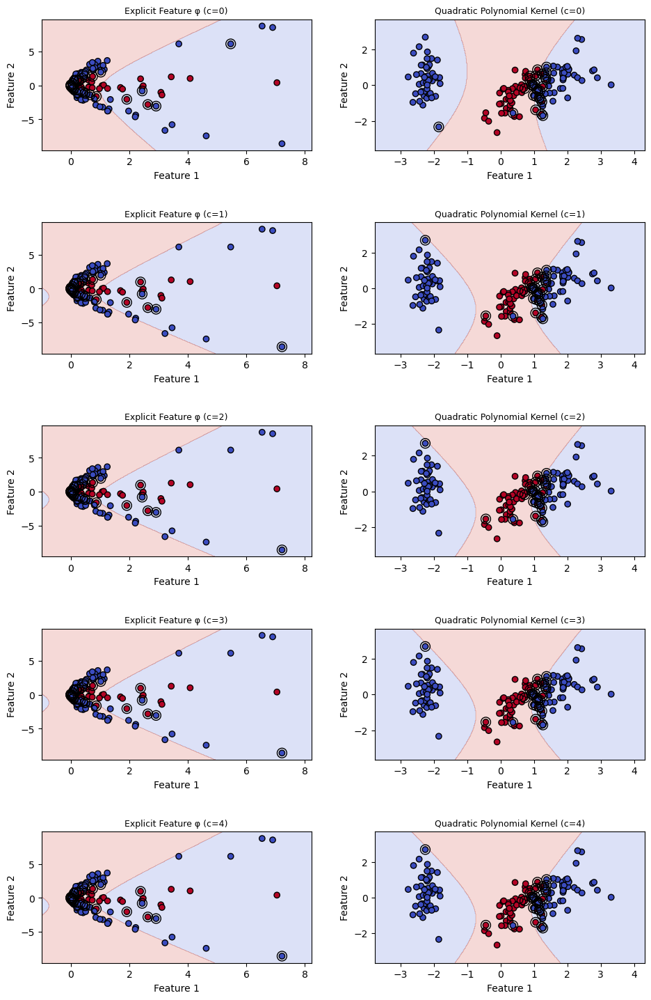

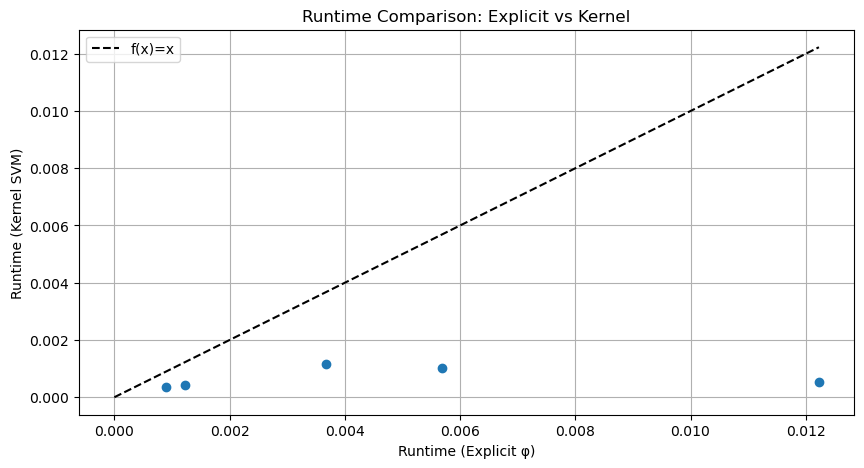

Comparing the results for the Breast Cancer dataset


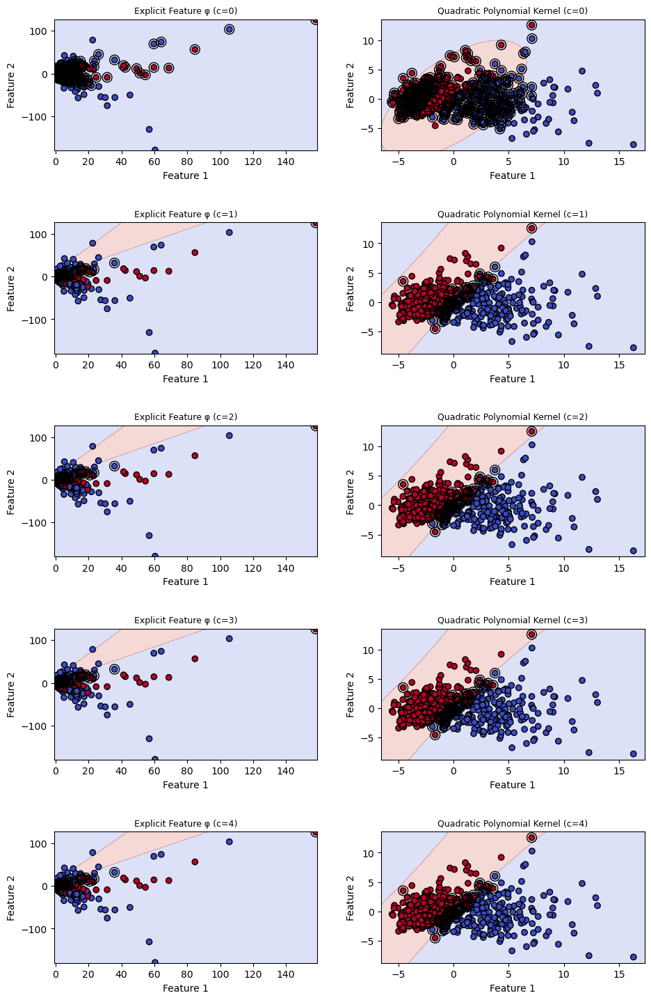

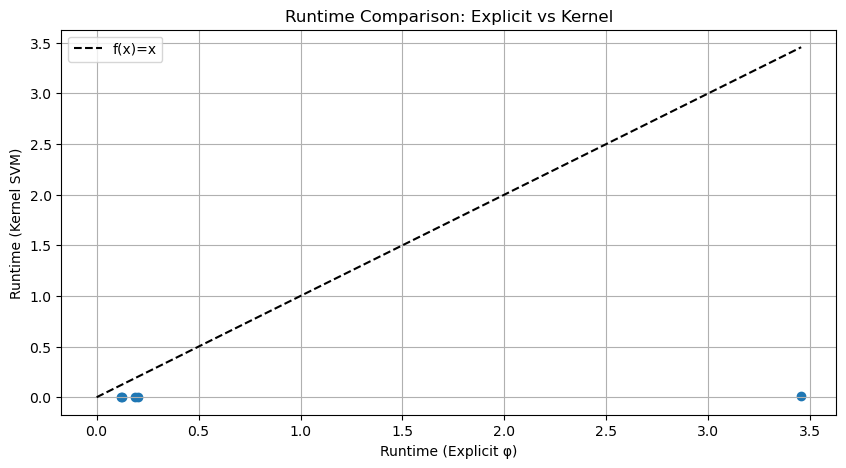

In [7]:
# Hyperparameters
C = 100
# Load the Iris dataset
iris = load_iris()
X_iris = iris.data
y_iris = (iris.target == 1).astype(int) # 1 == versicolor
print("Comparing the results for the Iris dataset")
compare_results(X_iris, y_iris, C)
# Load the Breast Cancer dataset
cancer = load_breast_cancer()
X_cancer = cancer.data
y_cancer = cancer.target
print("Comparing the results for the Breast Cancer dataset")
compare_results(X_cancer, y_cancer, C)